In [24]:
import utils_notebook as un
import datajoin as dj
import pandas as pd
import numpy as np
import requests
import io

import importlib
importlib.reload(un)
importlib.reload(dj)
print()


import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (20, 10)

plt.rcParams['figure.dpi'] = 150

import seaborn as sns
sns.set_context('poster')
import datetime
from astropy.coordinates import SkyCoord
from astropy.time import Time
import astropy.units as u

from fink_filters.filter_mm_module.filter import grb_bronze_events, grb_silver_events, grb_gold_events, gw_bronze_events

In [2]:
fink_mm_data_path = "ztf_x_gcn_data"
fink_mm_online_path = "ztf_x_gcn_data"

online_pdf = spark.read\
    .option("basePath", fink_mm_data_path)\
    .option('mergeSchema', True)\
    .format("parquet")\
    .load(fink_mm_online_path)

columns = online_pdf.columns
cols_to_keep = [col for col in columns if col != "raw_event"]
online_pdf = online_pdf.select(cols_to_keep).toPandas()

In [3]:
data_join = dj.DataJoin(online_pdf)

## GCN N° 713559497 / GRB230812B

Comments:

ZTF23abanmvi has been reported in TNS by ZTF team as  ‘AT 2023rae’, no classification and no spectra.
The delay respect to the triggerTime are 17.3447 days. 

Afterglow detected for this event at the position of ZTF23aaxeacr, (ra=249.13, dec=47.86). This object is not in the fink database because of system failure.

In [144]:
gcn_713559497 = data_join.get_gcn_join("713559497", "initial")

In [145]:
print(gcn_713559497.info())

+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| triggerId |       triggerTimeUTC       | observatory | instrument | event | gcn_loc_error | gcn_status |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| 713559497 | 2023-08-12 20:58:12.050000 |    Fermi    |    GBM     |       |     60.0      |  initial   |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+


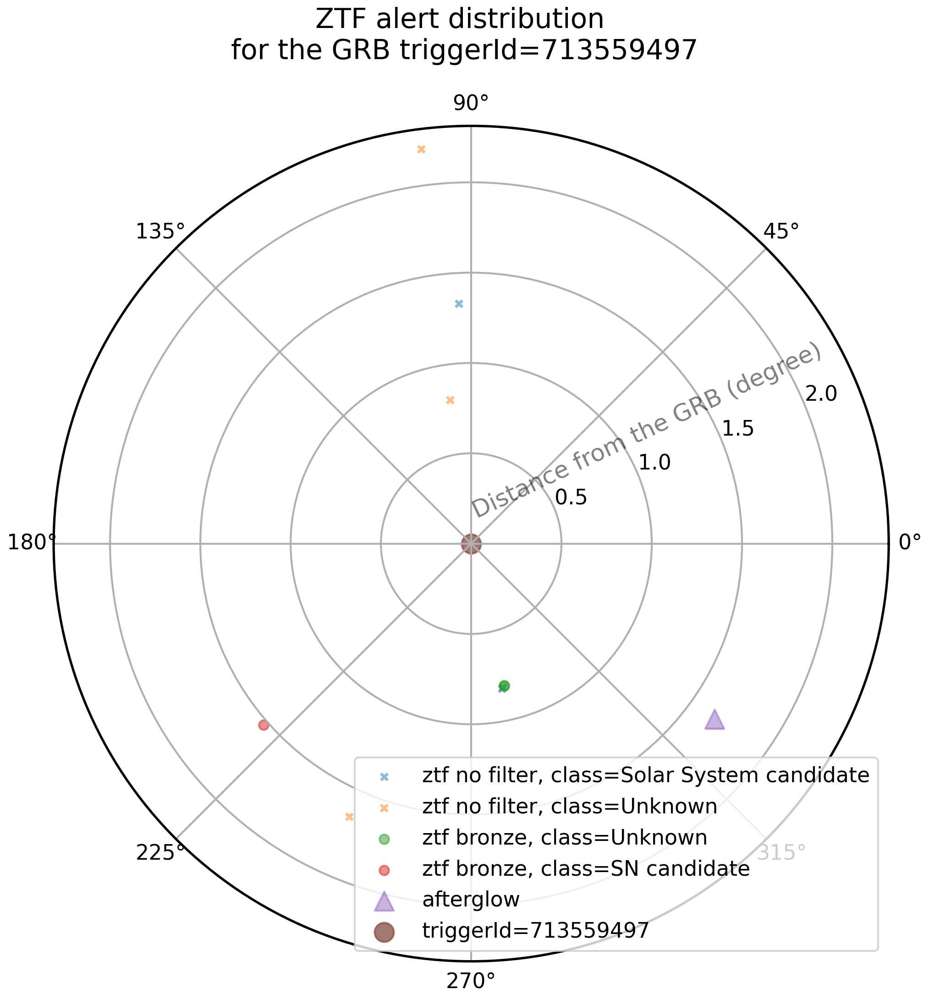

In [146]:
gcn_713559497.plot_alert_distribution()

In [241]:
ZTF23abanmvi = gcn_713559497.get_ztf_obj("ZTF23abanmvi")

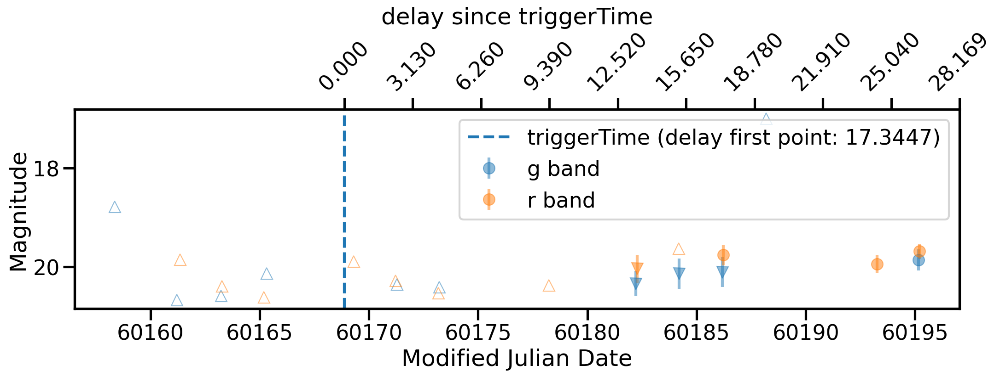

In [242]:
ZTF23abanmvi.plot_lighcurve()

In [243]:
ZTF23abatbhw = gcn_713559497.get_ztf_obj("ZTF23abatbhw")

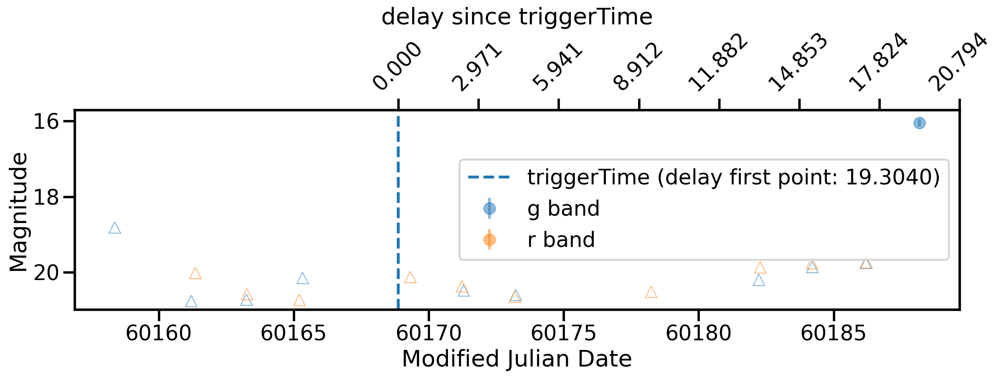

In [244]:
ZTF23abatbhw.plot_lighcurve()

## GCN N° 714809315 / GRB230827B

Comments:
	Two ZTF silver match
    
    Long GRB : T90 ~ 11 s (50-300 keV)

ZTF23abaanxz is the afterglow of this GCN event. Two points in r band, fast fading reported by ztf team as the afterglow. 


In [249]:
gcn_714809315 = data_join.get_gcn_join("714809315", "initial")

In [250]:
print(gcn_714809315.info())

+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| triggerId |       triggerTimeUTC       | observatory | instrument | event | gcn_loc_error | gcn_status |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| 714809315 | 2023-08-27 08:08:30.730000 |    Fermi    |    GBM     |       |     130.2     |  initial   |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+


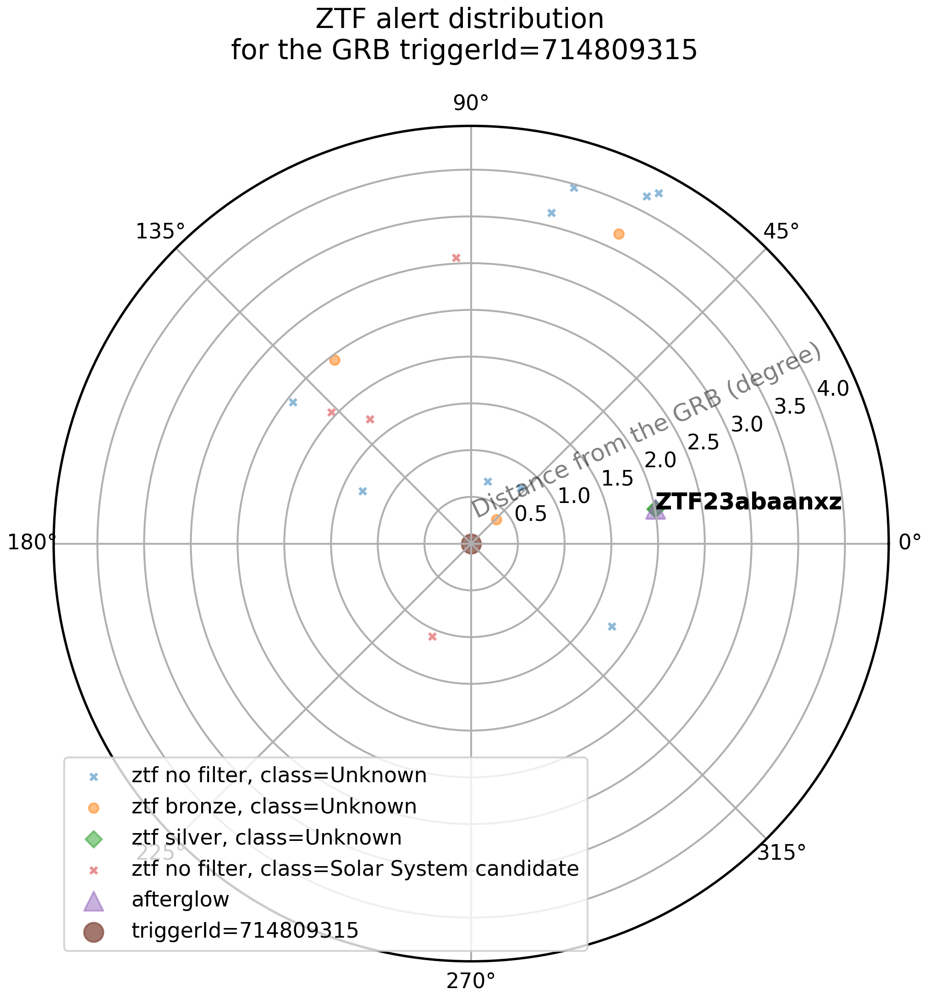

In [251]:
gcn_714809315.plot_alert_distribution()

In [252]:
ZTF23abaanxz = gcn_714809315.get_ztf_obj("ZTF23abaanxz")

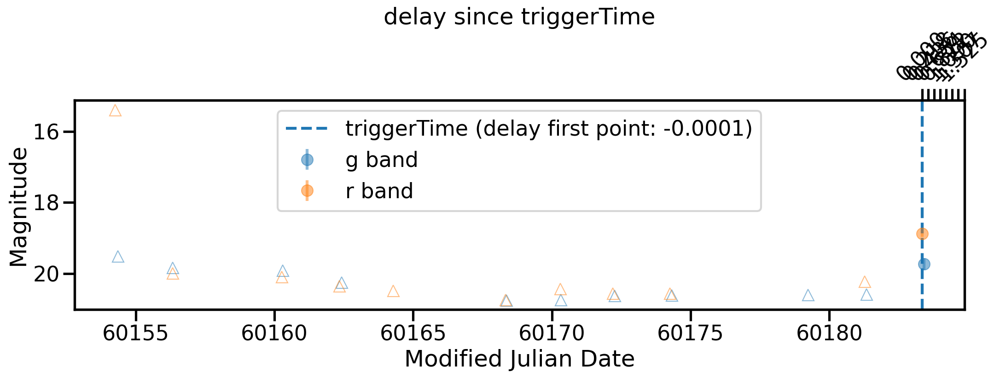

In [253]:
ZTF23abaanxz.plot_lighcurve()

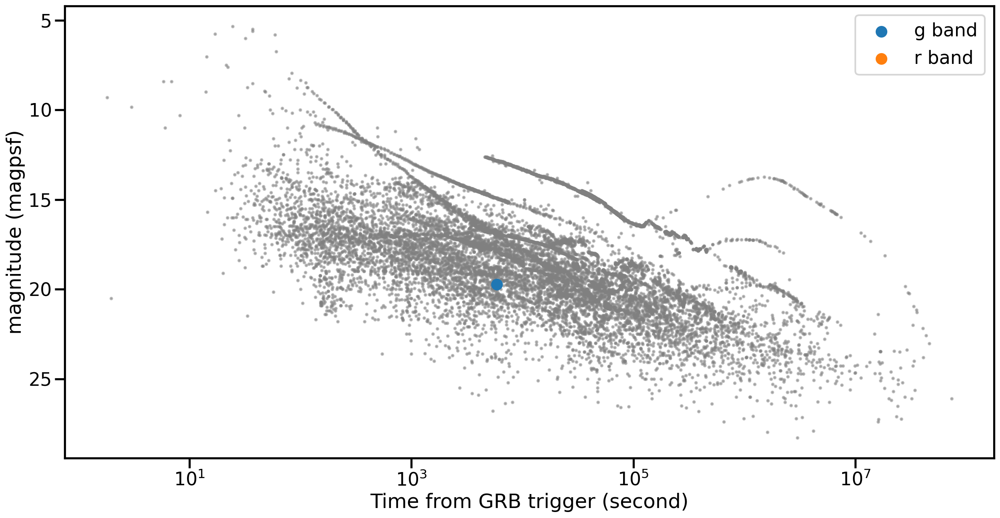

In [254]:
ZTF23abaanxz.lc_compare()

## GCN N° 709864601 / GRB230701

Comments : 

One object seem encouraging for this GCN ZTF23aaspcfl : classified by Fink as SnIa and reported in TNS ( SN 2023nlj)

classified as Long GRB

A spectra is available for this object : classified in TNS as SnIb 
Redshift = 0.03, no galaxy visible


Number of detections : 51 (last 2023-10-07 04:20:50.997) 
delay since triggerTime: 17.25 days (start with the rising of the supernovae).
A increasing part is visible in the upper limit before the supernovae at the triggerTime
One another fink classified supernovae are in the grb error circle but the lightcurve are noisy and no classification in TNS.


In [255]:
gcn_709864601 = data_join.get_gcn_join("709864601", "initial")

In [256]:
print(gcn_709864601.info())

+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| triggerId |       triggerTimeUTC       | observatory | instrument | event | gcn_loc_error | gcn_status |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| 709864601 | 2023-07-01 02:36:36.750000 |    Fermi    |    GBM     |       |     237.6     |  initial   |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+


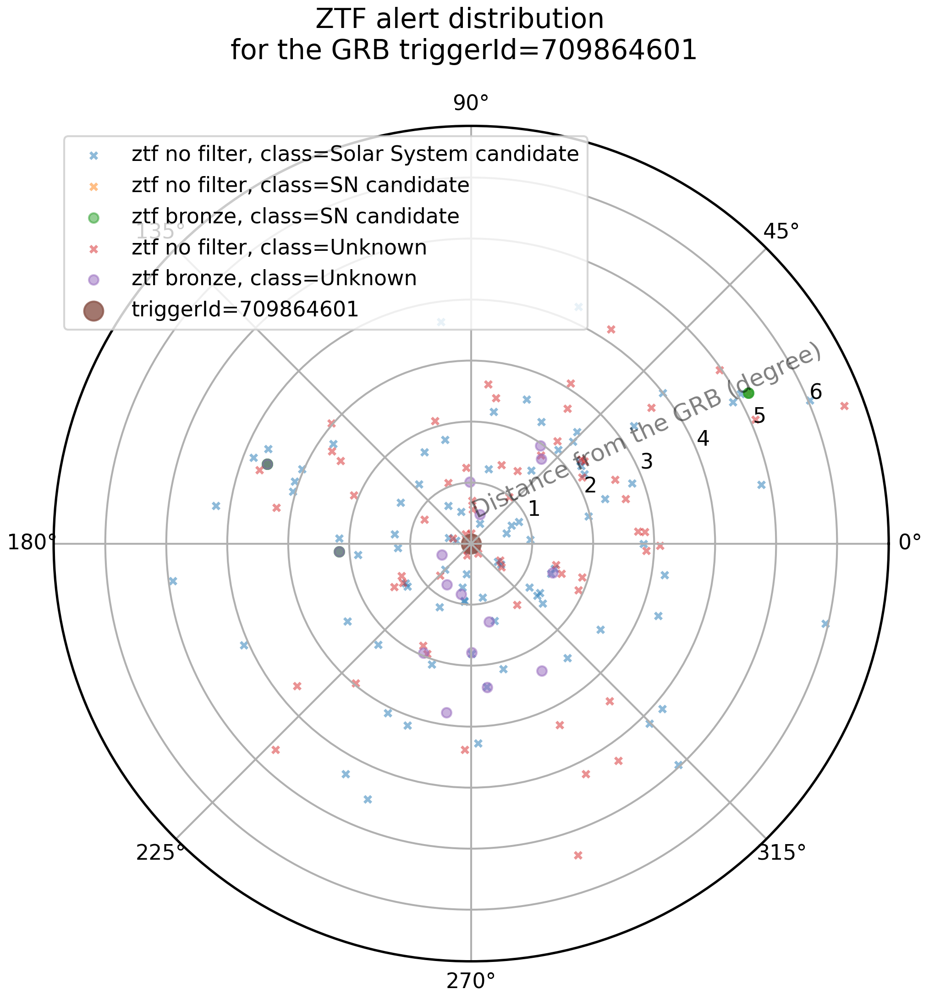

In [257]:
gcn_709864601.plot_alert_distribution()

In [258]:
ZTF23aaspcfl = gcn_709864601.get_ztf_obj("ZTF23aaspcfl")

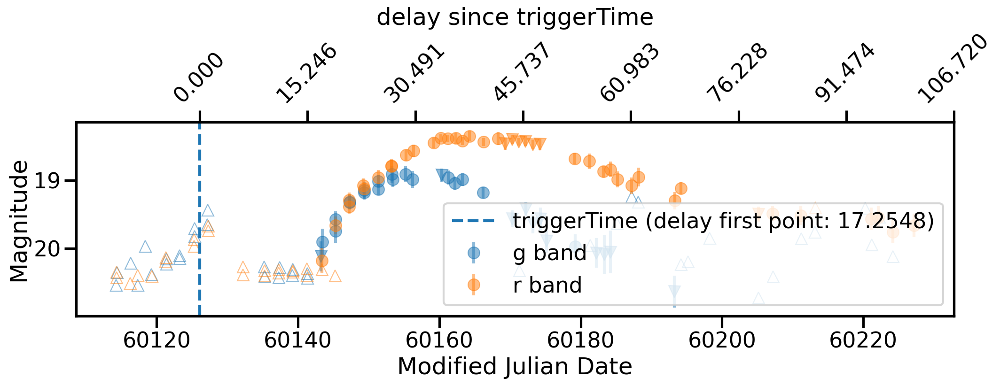

In [259]:
ZTF23aaspcfl.plot_lighcurve()

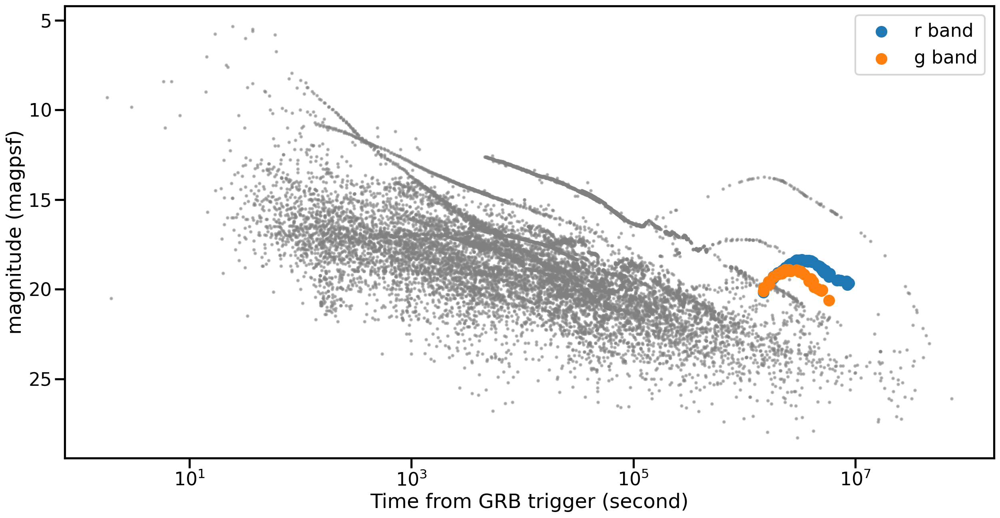

In [260]:
ZTF23aaspcfl.lc_compare()

## GCN N° 709083929 / GRB230622

Comments:

Long GRB : T90 ~ 18.37 +- 13.63 sec

- ZTF23aapnixu: lastly classified by fink as unknown, but has been classified as SnIa and just SN during the timeline. fink reported as SnIa in TNS

Two spectra available for this object in TNS named as  SN 2023lkm.

TNS classification : Sn Ib/c

Redshift : 0.02469


20 valid detection in fink (last detection: 2023-07-26 09:58:08.003)
Two merging galaxies are visible
delay since triggerTime: 2.3817 days (seem quite short)
	
- ZTF23aapzouv: another object seem promising to associate with this gcn.
classified by fink as supernovae
no tns report


delay since triggerTime: 6.3812 days
4 valid detection in r band with large error bar (almost no variation)
small galaxy visible 


In [261]:
gcn_709083929 = data_join.get_gcn_join("709083929", "initial")

In [262]:
print(gcn_709083929.info())

+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| triggerId |       triggerTimeUTC       | observatory | instrument | event | gcn_loc_error | gcn_status |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| 709083929 | 2023-06-22 01:45:24.830000 |    Fermi    |    GBM     |       |     272.4     |  initial   |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+


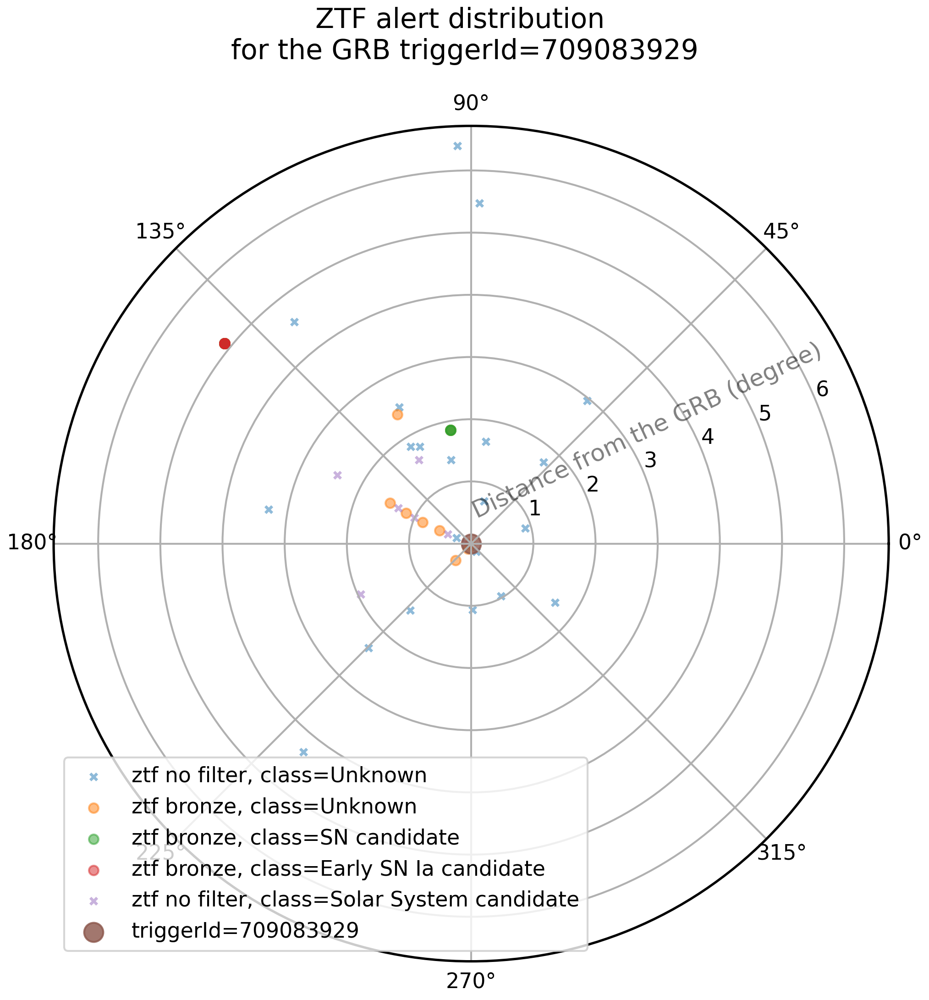

In [263]:
gcn_709083929.plot_alert_distribution()

In [264]:
ZTF23aapnixu = gcn_709083929.get_ztf_obj("ZTF23aapnixu")
ZTF23aapzouv = gcn_709083929.get_ztf_obj("ZTF23aapzouv")

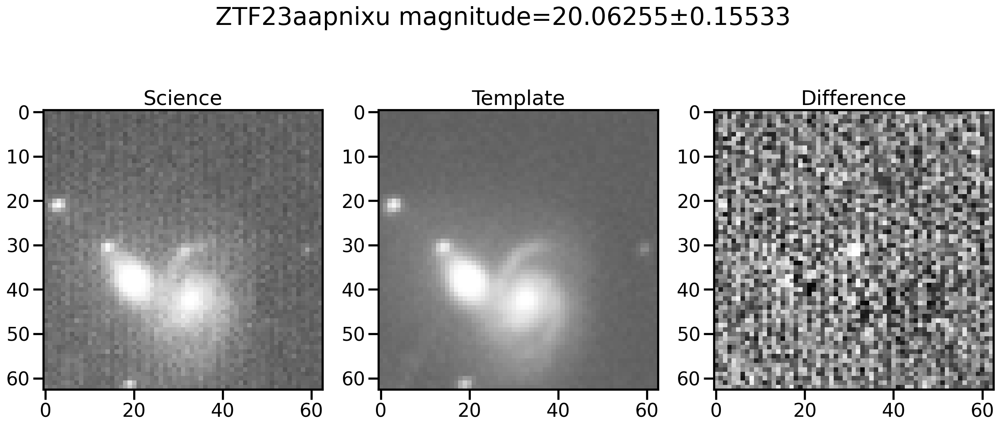

In [265]:
ZTF23aapnixu.plot_images()

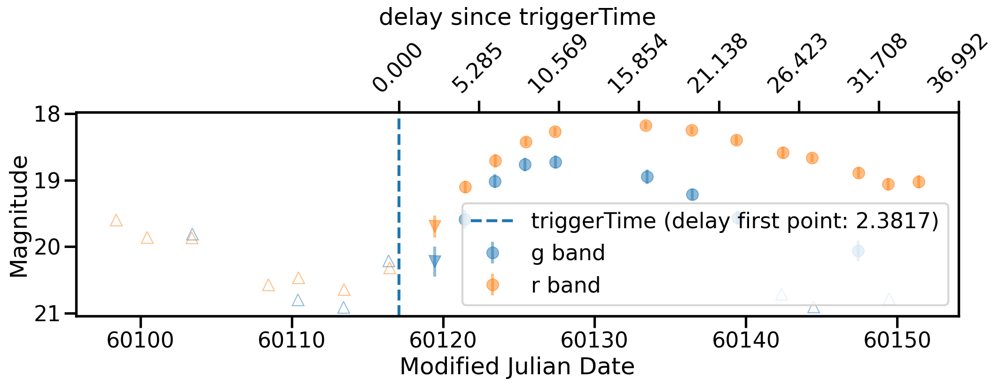

In [266]:
ZTF23aapnixu.plot_lighcurve()

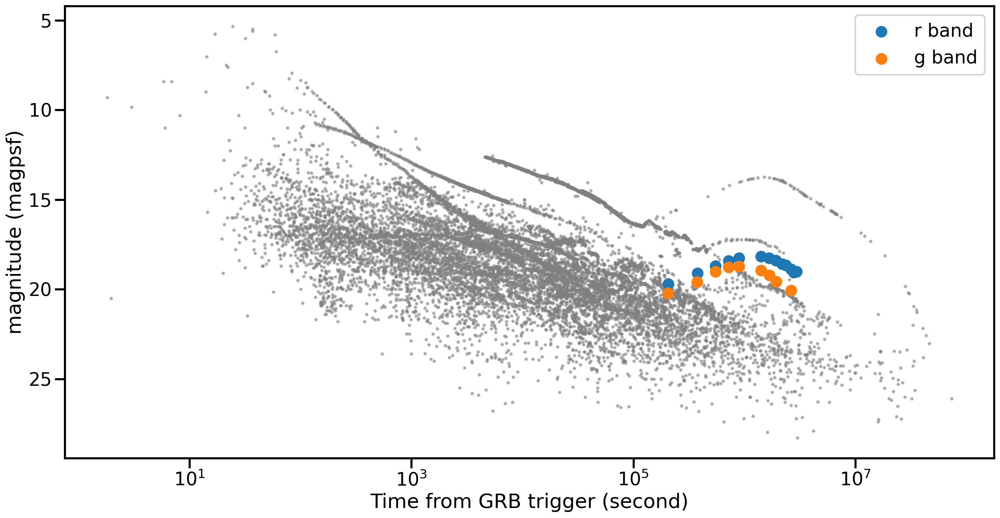

In [267]:
ZTF23aapnixu.lc_compare()

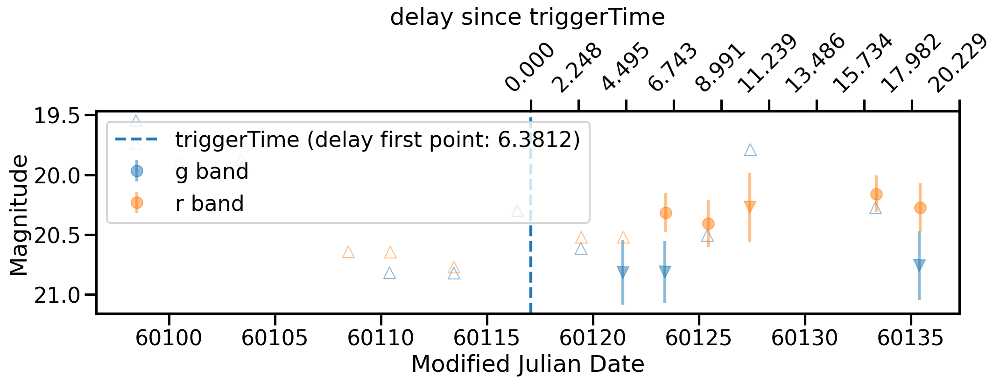

In [268]:
ZTF23aapzouv.plot_lighcurve()

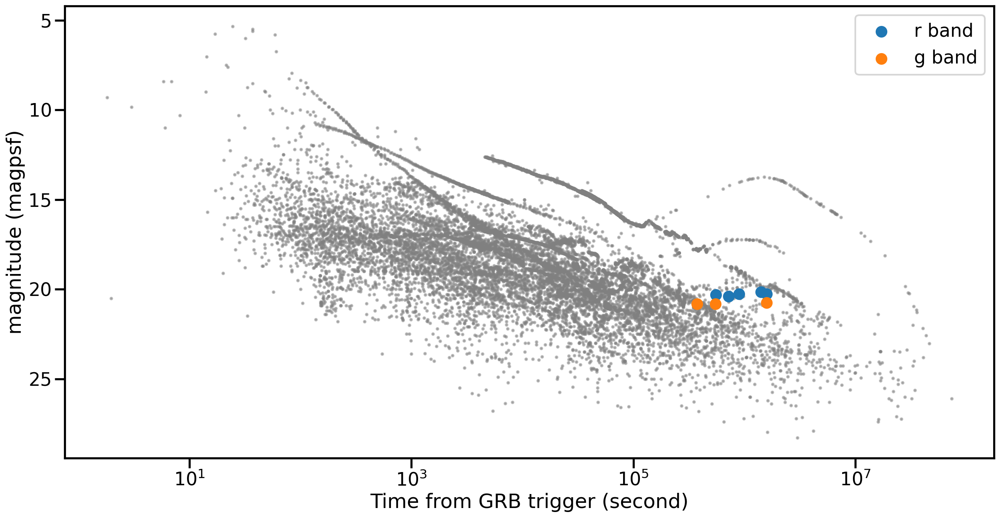

In [269]:
ZTF23aapzouv.lc_compare()

## GCN N° 711299080 / GRB230717

Comments: 

Long GRB
    
Look for alerts with Kilonova or Supernova tag, 

found ZTF23aavvdix in the error box of this GCN
classified as SN II in TNS, 

Redshift = 0.02

detected 16.7 days after triggerTime. 


In [270]:
gcn_711299080 = data_join.get_gcn_join("711299080", "initial")

In [271]:
print(gcn_711299080.info())

+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| triggerId |       triggerTimeUTC       | observatory | instrument | event | gcn_loc_error | gcn_status |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| 711299080 | 2023-07-17 17:04:35.890000 |    Fermi    |    GBM     |       |    412.998    |  initial   |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+


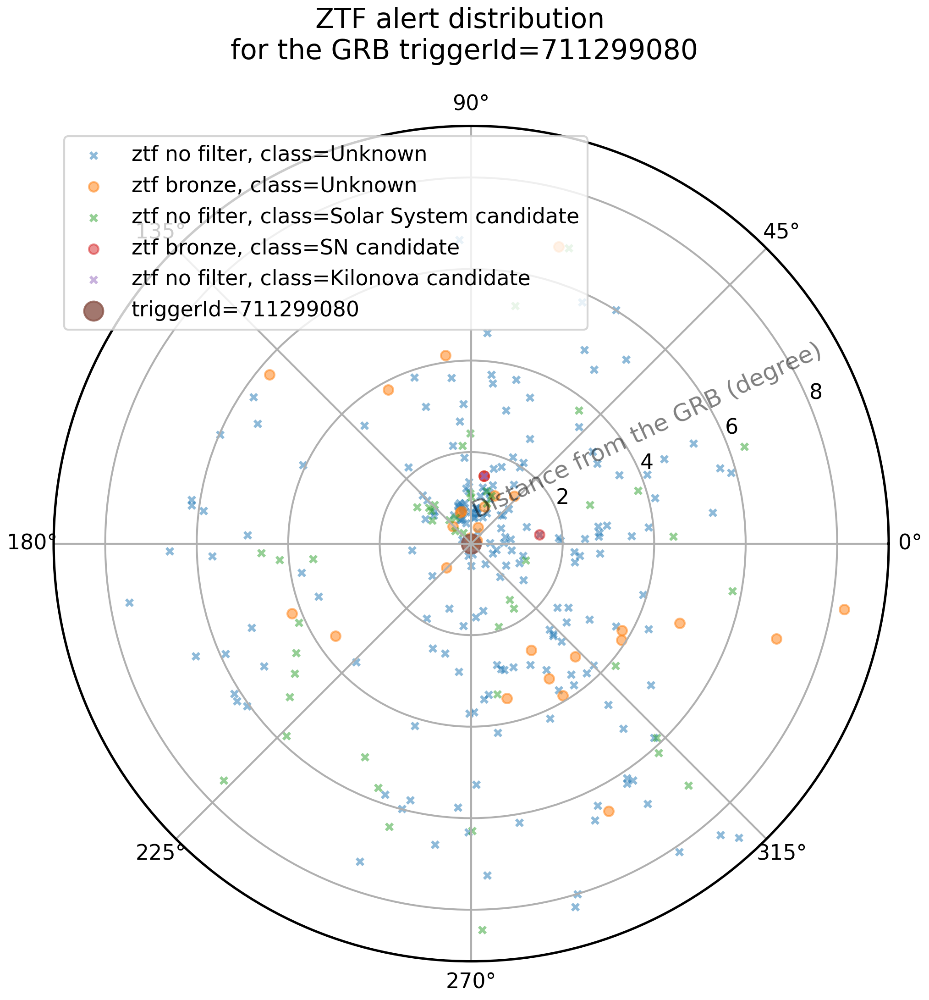

In [272]:
gcn_711299080.plot_alert_distribution()

In [273]:
ZTF23aavvdix = gcn_711299080.get_ztf_obj("ZTF23aavvdix")
ZTF23aavvipn = gcn_711299080.get_ztf_obj("ZTF23aavvipn")

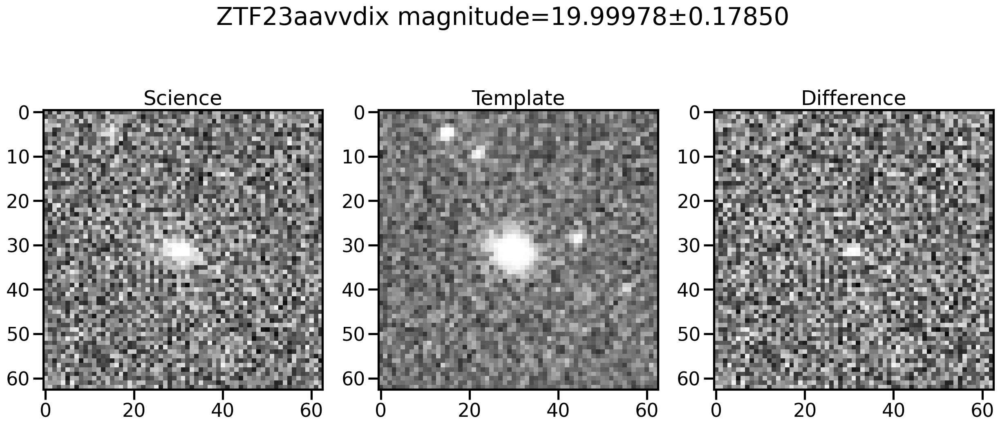

In [274]:
ZTF23aavvdix.plot_images()

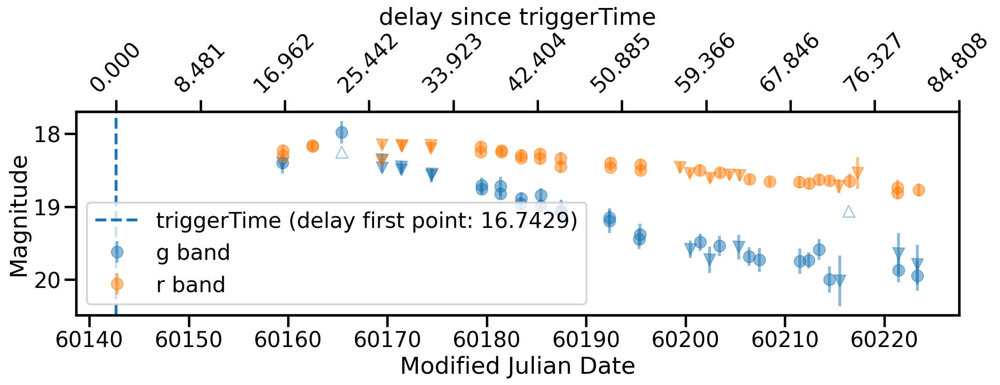

In [275]:
ZTF23aavvdix.plot_lighcurve()

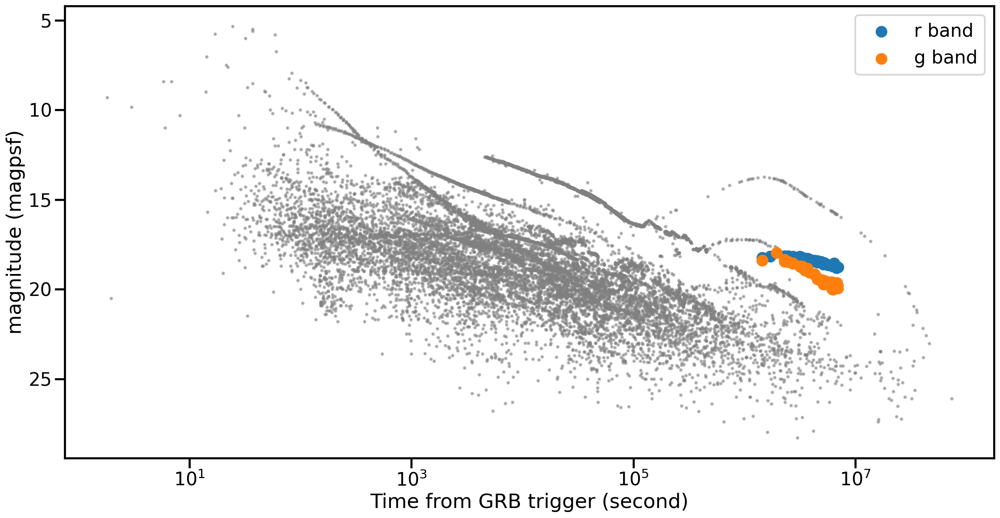

In [276]:
ZTF23aavvdix.lc_compare()

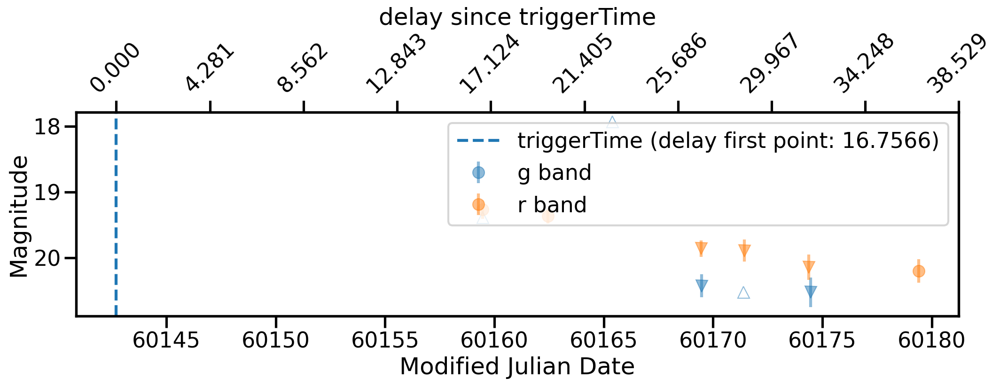

In [277]:
ZTF23aavvipn.plot_lighcurve()

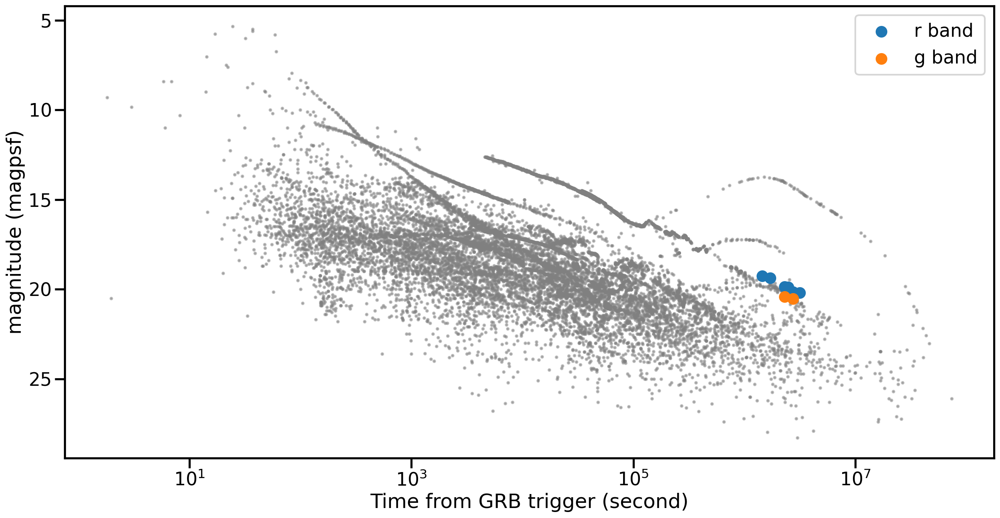

In [278]:
ZTF23aavvipn.lc_compare()

## GCN N° 710711405 / GRB230710

Comments: 

Long GRB 

One SN in the error box

ZTF23aaufzym classified in TNS as SN II

Redshift = 0.03728

delay = 13.5 days


In [279]:
gcn_710711405 = data_join.get_gcn_join("710711405", "initial")

In [280]:
print(gcn_710711405.info())

+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| triggerId |       triggerTimeUTC       | observatory | instrument | event | gcn_loc_error | gcn_status |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| 710711405 | 2023-07-10 21:50:00.790000 |    Fermi    |    GBM     |       |     286.8     |  initial   |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+


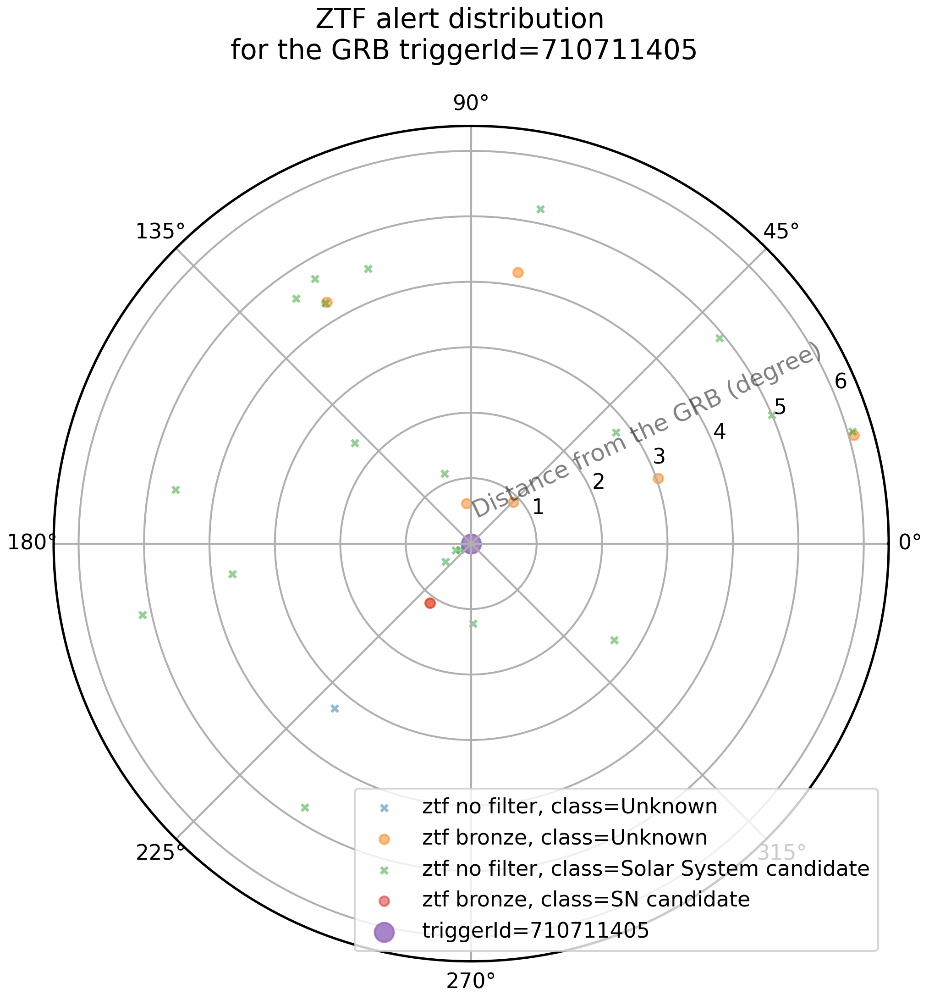

In [281]:
gcn_710711405.plot_alert_distribution()

In [282]:
ZTF23aaufzym = gcn_710711405.get_ztf_obj("ZTF23aaufzym")

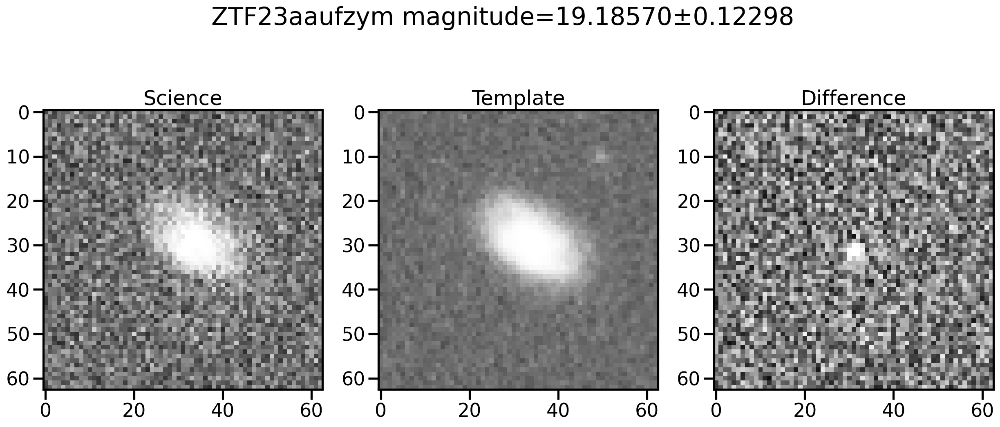

In [283]:
ZTF23aaufzym.plot_images()

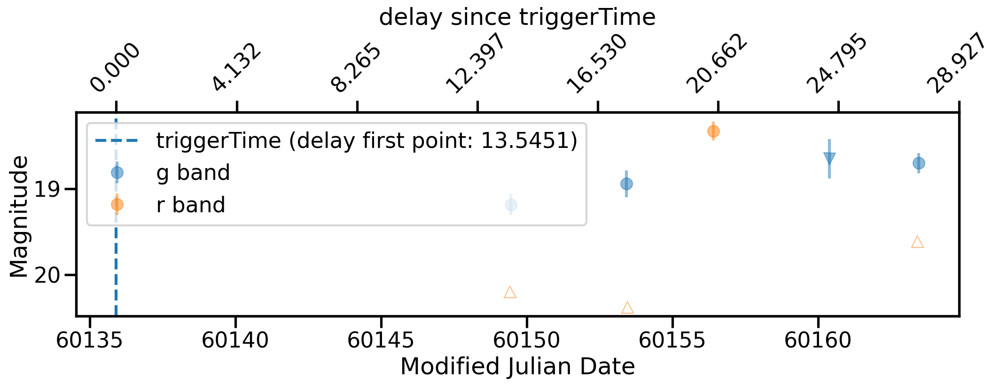

In [284]:
ZTF23aaufzym.plot_lighcurve()

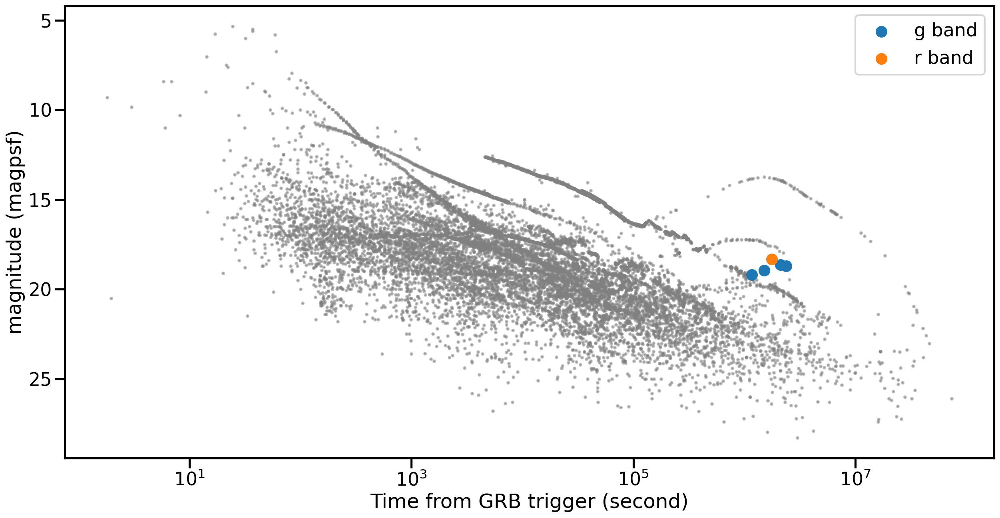

In [285]:
ZTF23aaufzym.lc_compare()

# Extend search

## GCN N° 713966581 / GRB230817

Comments

Long GRB : T90 ~ 48 (+6, -7) s

ZTF23ababkmo classified in TNS as SN II (SN 2023qxk)

Redshift = 0.041

delay = 9.80 days

In [286]:
gcn_713966581 = data_join.get_gcn_join("713966581", "initial")

In [287]:
print(gcn_713966581.info())

+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| triggerId |       triggerTimeUTC       | observatory | instrument | event | gcn_loc_error | gcn_status |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| 713966581 | 2023-08-17 14:02:56.560000 |    Fermi    |    GBM     |       |     418.2     |  initial   |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+


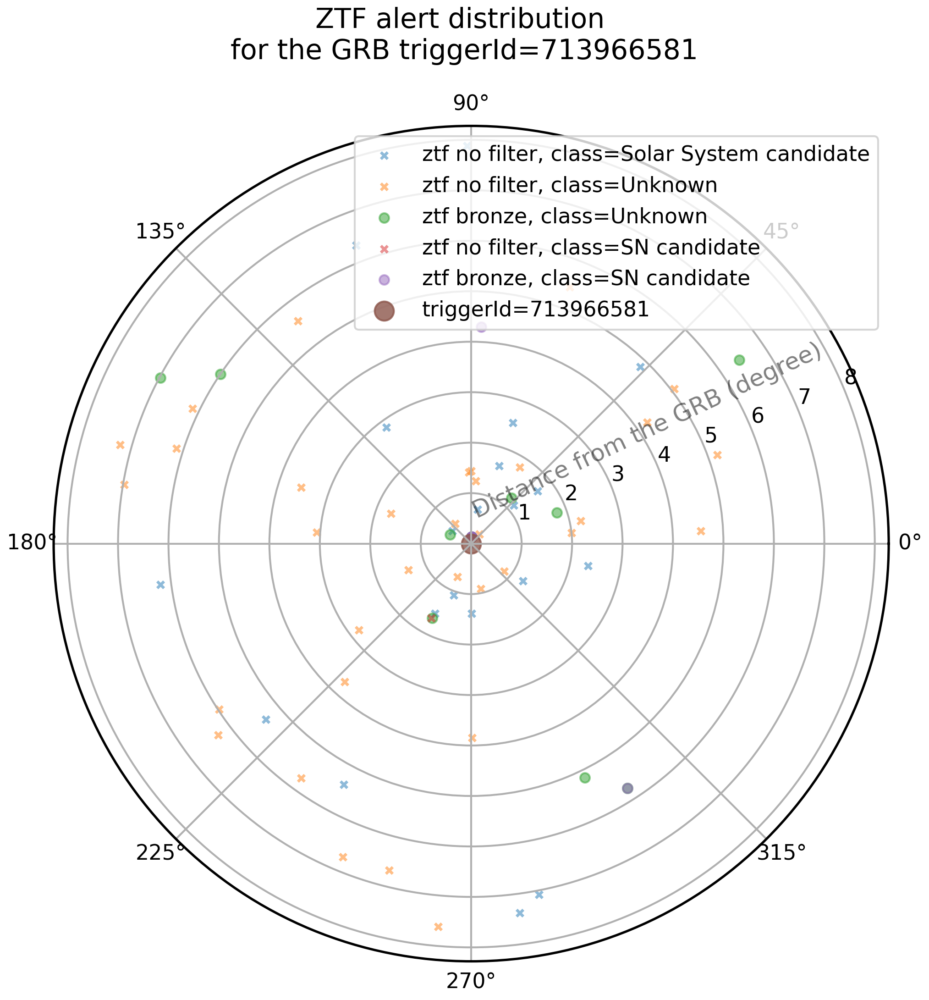

In [288]:
gcn_713966581.plot_alert_distribution()

In [289]:
ZTF23ababkmo = gcn_713966581.get_ztf_obj("ZTF23ababkmo")

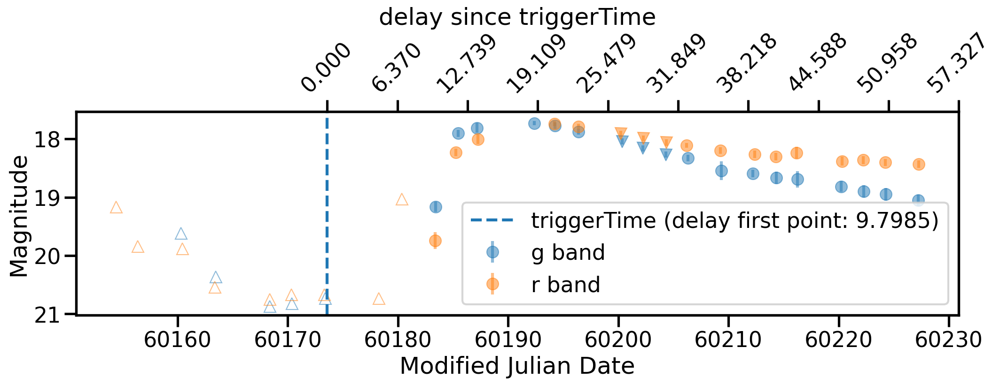

In [290]:
ZTF23ababkmo.plot_lighcurve()

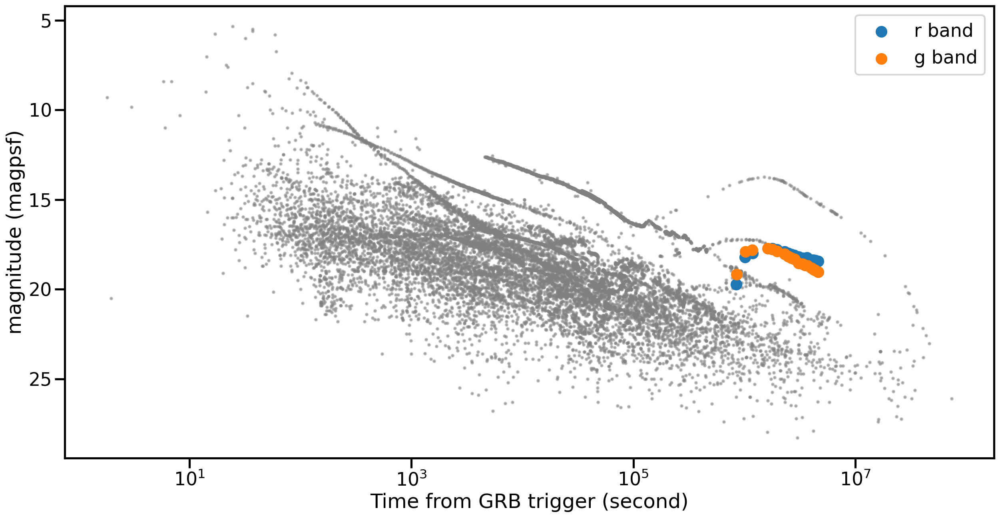

In [291]:
ZTF23ababkmo.lc_compare()

## GCN N° 710120768 / GRB230704

Comments:



Crowded error box but some objects are interesting

- ZTF23aatqmbb
    
    No classification in TNS, 
    
    Alerce reported as Early Sn candidates
    
    
    delay = 19.3 days
    
- ZTF23aarxuzu
    
    No classification in TNS
    
    Alerce reported as Early Sn candidate
    
    delay = 10.3 days
    
- ZTF23aasmafk

    No classification in TNS
    
    Alerce reported as SN candidate
    
    delay = 13.4 days
    
    Shape of upper limit coincident with the triggerTime could indicate a possible afterglow followed by a SN ????

In [4]:
gcn_710120768 = data_join.get_gcn_join("710120768", "initial")

In [5]:
print(gcn_710120768.info())

+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| triggerId |       triggerTimeUTC       | observatory | instrument | event | gcn_loc_error | gcn_status |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+
| 710120768 | 2023-07-04 01:46:03.510000 |    Fermi    |    GBM     |       |    415.998    |  initial   |
+-----------+----------------------------+-------------+------------+-------+---------------+------------+


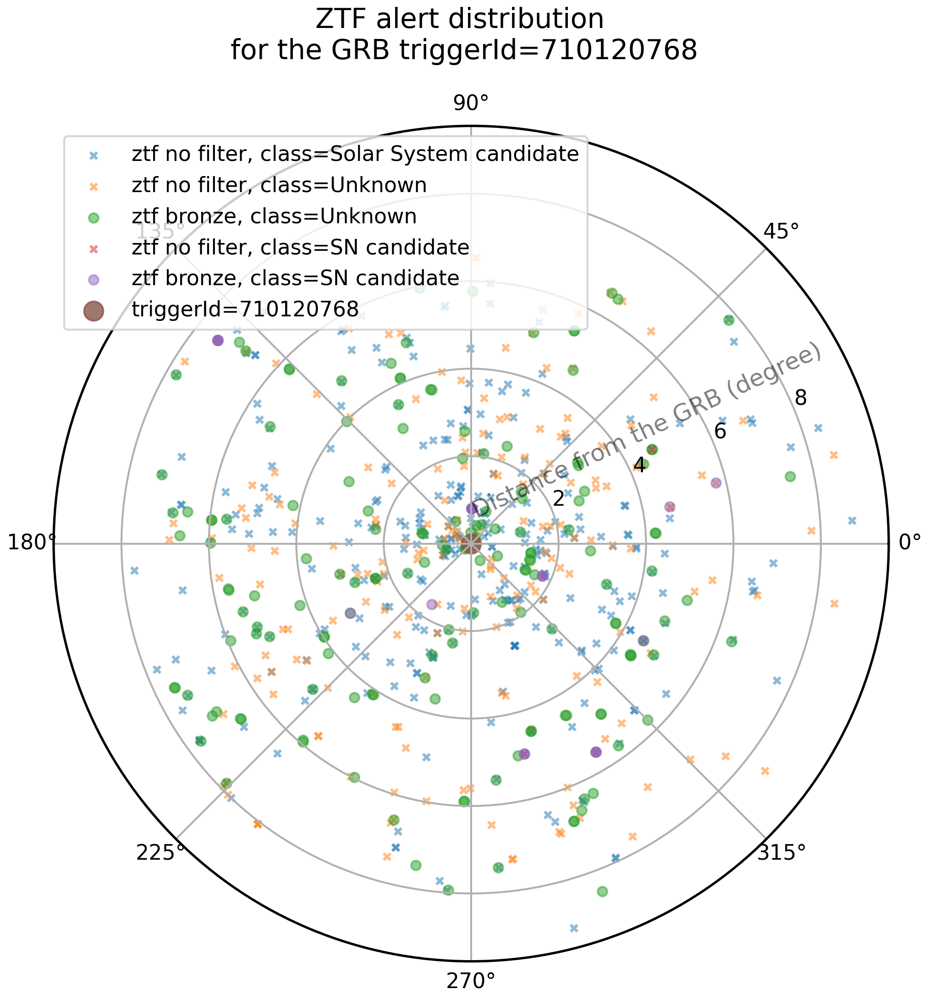

In [14]:
gcn_710120768.plot_alert_distribution()

In [15]:
ZTF23aatqmbb = gcn_710120768.get_ztf_obj("ZTF23aatqmbb")

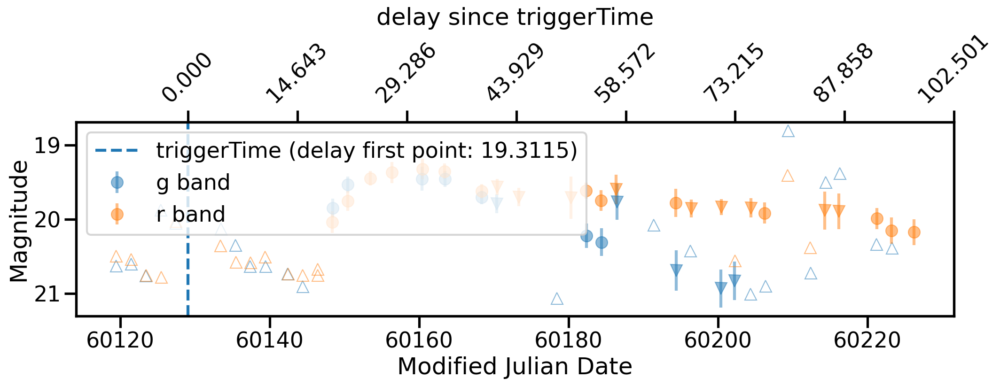

In [16]:
ZTF23aatqmbb.plot_lighcurve()

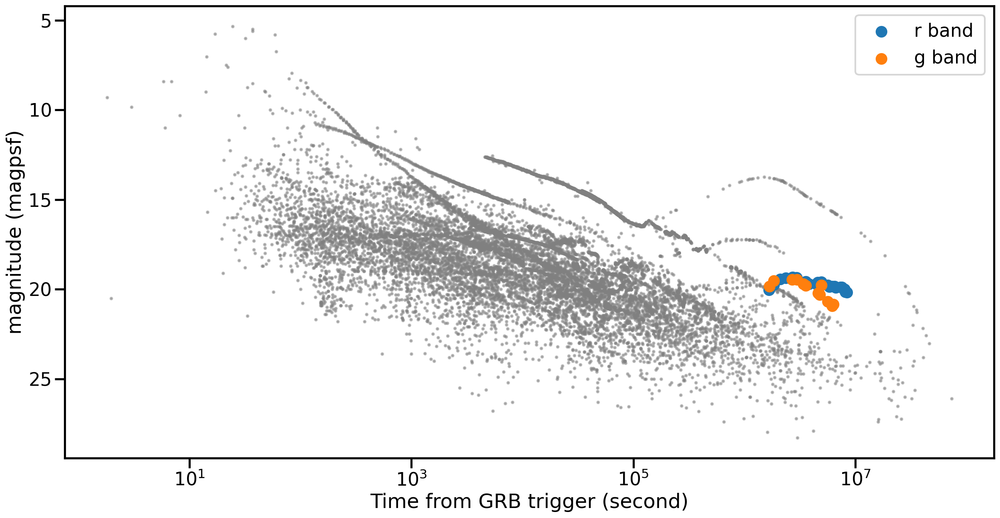

In [17]:
ZTF23aatqmbb.lc_compare()

In [18]:
ZTF23aarxuzu = gcn_710120768.get_ztf_obj("ZTF23aarxuzu")

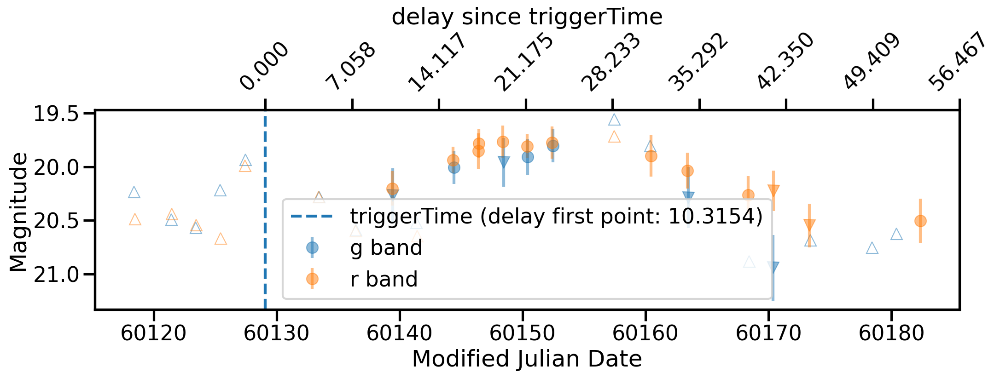

In [19]:
ZTF23aarxuzu.plot_lighcurve()

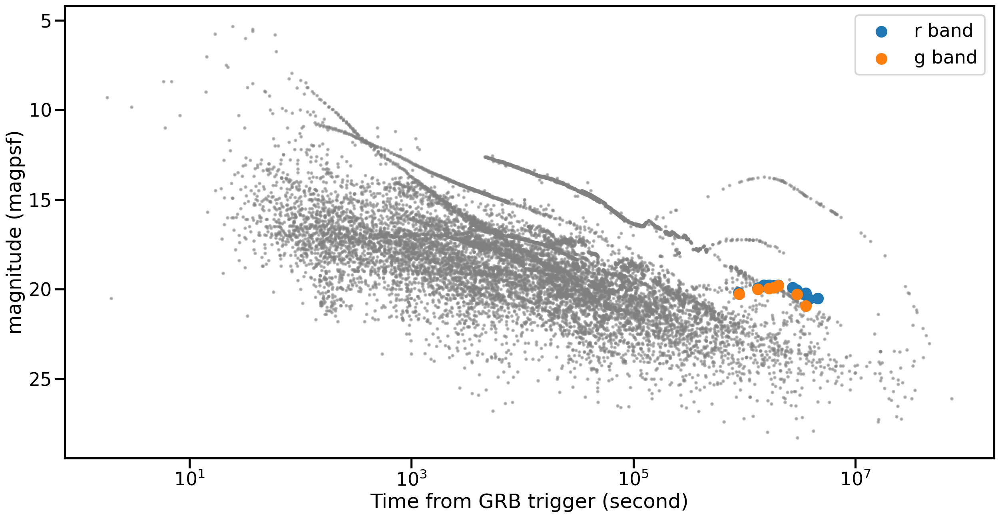

In [20]:
ZTF23aarxuzu.lc_compare()

In [21]:
ZTF23aasmafk = gcn_710120768.get_ztf_obj("ZTF23aasmafk")

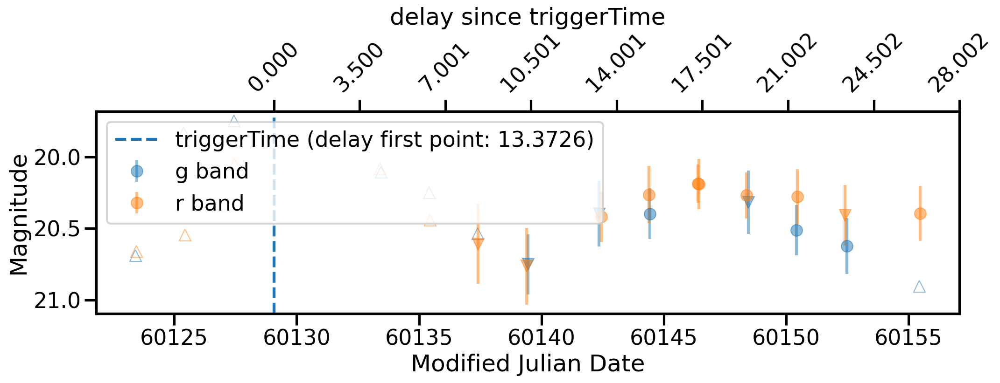

In [22]:
ZTF23aasmafk.plot_lighcurve()

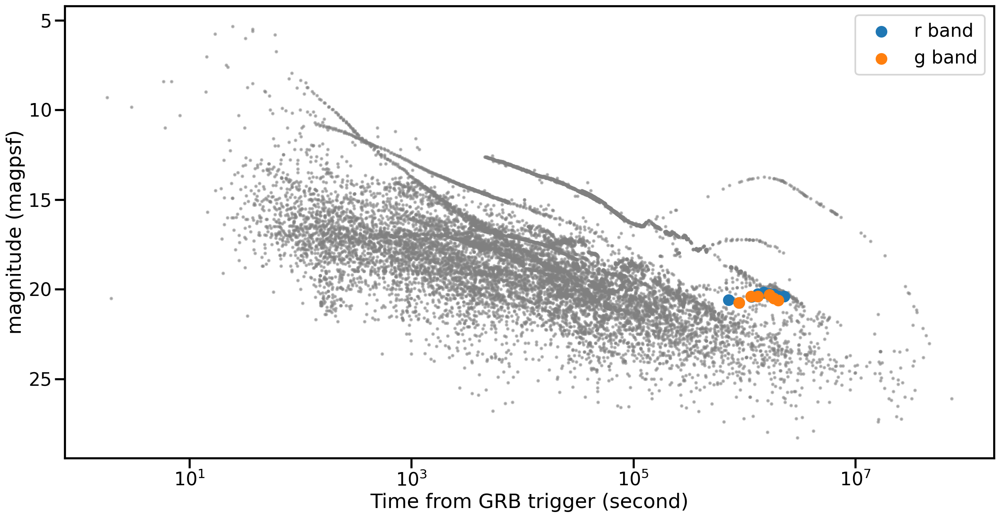

In [23]:
ZTF23aasmafk.lc_compare()